In [1]:
noise = 0
loss = 'dice'
arch = 'unet'

In [2]:
from keras.layers import Input,Dense,Flatten,Dropout,Reshape,Conv2D,MaxPooling2D,UpSampling2D,Conv2DTranspose
from keras.layers import Activation
from keras.layers import concatenate
from keras.layers import BatchNormalization
from keras.models import Model
from keras.preprocessing.image import ImageDataGenerator
from keras.callbacks import ModelCheckpoint
from keras.optimizers import Adam
from keras import backend as K
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import tifffile
import cv2
import pandas as pd


2024-09-24 16:09:33.039634: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-09-24 16:09:33.059184: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-09-24 16:09:33.059207: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-09-24 16:09:33.059757: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-09-24 16:09:33.063138: I tensorflow/core/platform/cpu_feature_guar

In [3]:

import tensorflow as tf
import keras
print('Tensorflow version:', tf.__version__)
print('Keras version:', keras.__version__)

Tensorflow version: 2.15.0
Keras version: 2.15.0


In [4]:
!nvidia-smi

Tue Sep 24 16:09:34 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.183.01             Driver Version: 535.183.01   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  NVIDIA RTX A5000               Off | 00000000:01:00.0  On |                  Off |
| 30%   45C    P5              31W / 230W |    405MiB / 24564MiB |     23%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [5]:
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    try:
        # Enable memory growth for each GPU
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
        print("Memory growth set for all GPUs.")
    except RuntimeError as e:
        # Memory growth must be set before GPUs have been initialized
        print(e)


Memory growth set for all GPUs.


2024-09-24 16:09:34.296767: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-09-24 16:09:34.300154: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-09-24 16:09:34.300232: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-

In [6]:
df_dir = '/home/miglab/loss function project/spleen segmentation/Image_data/'
train_df = pd.read_csv(df_dir+'train_spleen.csv')
val_df = pd.read_csv(df_dir+'val_spleen.csv')

In [7]:
train_df = train_df.sample(frac=1,random_state=7) 
val_df =  val_df.sample(frac=1,random_state=7)

In [8]:
train_samples = len(train_df)
val_samples = len(val_df)

print(" Training Samples: ",train_samples,'\n',"Validation Samples: ",val_samples)

 Training Samples:  2955 
 Validation Samples:  695


In [9]:
train_df.head()

,image_path,label_path
2771,Image_data/Train/imagesTr/spleen_61_92.tiff,Image_data/Train/labelsTr/spleen_61_92.tiff
670,Image_data/Train/imagesTr/spleen_38_42.tiff,Image_data/Train/labelsTr/spleen_38_42.tiff
70,Image_data/Train/imagesTr/spleen_46_70.tiff,Image_data/Train/labelsTr/spleen_46_70.tiff
1651,Image_data/Train/imagesTr/spleen_12_80.tiff,Image_data/Train/labelsTr/spleen_12_80.tiff
1776,Image_data/Train/imagesTr/spleen_3_37.tiff,Image_data/Train/labelsTr/spleen_3_37.tiff


In [10]:
val_df.head()

,image_path,label_path
467,Image_data/Val/imagesVal/spleen_41_68.tiff,Image_data/Val/labelsVal/spleen_41_68.tiff
202,Image_data/Val/imagesVal/spleen_47_53.tiff,Image_data/Val/labelsVal/spleen_47_53.tiff
480,Image_data/Val/imagesVal/spleen_41_81.tiff,Image_data/Val/labelsVal/spleen_41_81.tiff
527,Image_data/Val/imagesVal/spleen_45_34.tiff,Image_data/Val/labelsVal/spleen_45_34.tiff
60,Image_data/Val/imagesVal/spleen_17_60.tiff,Image_data/Val/labelsVal/spleen_17_60.tiff


In [11]:
def load(files,mask=False):
    images =[]
    for file in files:
        if not mask:
            img = tifffile.imread('/home/miglab/loss function project/spleen segmentation/'+file)/255
            images.append(img)
        else:
            img = tifffile.imread('/home/miglab/loss function project/spleen segmentation/'+file)
            images.append(img)
    return np.asarray(images)

In [12]:
def noise_add(labels,noise_ratio):
    flip_indices =np.random.choice(len(labels),size=int(len(labels)*noise_ratio))
    labels[flip_indices]=1-labels[flip_indices]
    return labels

In [13]:
def imageLoader(df,batch_size,noise=0):

    L = len(df)
    

    #keras needs the generator infinite, so we will use while true  
    while True:

        batch_start = 0
        batch_end = batch_size

        while batch_start < L:
            limit = min(batch_end, L)
            
            X = load(df['image_path'][batch_start:limit])
            Y = load(df['label_path'][batch_start:limit],mask=True)
            Y = noise_add(Y,noise)
            
            yield (X,Y) #a tuple with two numpy arrays with batch_size samples     

            batch_start += batch_size   
            batch_end += batch_size

# Metrics

In [14]:
def dice_coef(y_true, y_pred):
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return (2. * intersection + K.epsilon()) / (K.sum(y_true_f) + K.sum(y_pred_f) + K.epsilon())

def jaccard_index(y_true, y_pred):
    intersection = K.sum(y_true * y_pred)
    union = K.sum(y_true) + K.sum(y_pred) - intersection
    return (intersection + K.epsilon()) / (union + K.epsilon())

def precision(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
    return true_positives / (predicted_positives + K.epsilon())

def recall(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    total_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
    return true_positives / (total_positives + K.epsilon())

def hausdorff_distance(y_true, y_pred):
    surface_distances = tf.reduce_sum(y_true * y_pred, axis=[1, 2]) / tf.reduce_sum(y_true + y_pred, axis=[1, 2])
    hausdorff_distance = tf.reduce_max(surface_distances)
    return hausdorff_distance

def specificity(y_true, y_pred):
    true_negatives = K.sum(K.round(K.clip((1 - y_true) * (1 - y_pred), 0, 1)))
    total_negatives = K.sum(K.round(K.clip(1 - y_true, 0, 1)))
    return true_negatives / (total_negatives + K.epsilon())

def f1_score(y_true, y_pred):
    precision_value = precision(y_true, y_pred)
    recall_value = recall(y_true, y_pred)
    f1 = 2 * (precision_value * recall_value) / (precision_value + recall_value + K.epsilon())
    return f1

def dpce(y_true, y_pred, distance_fn=tf.keras.losses.MSE):
    ce_loss = tf.keras.losses.BinaryCrossentropy()(y_true, y_pred)  # Compute standard cross entropy loss

    # Calculate the distance penalty using the specified distance function
    distance_loss = distance_fn(y_true, y_pred)

    # Combine the cross entropy loss and distance penalty
    loss = ce_loss + distance_loss

    return loss

def accuracy(y_true, y_pred):
    correct_predictions = tf.equal(tf.round(y_pred), y_true)
    accuracy = tf.reduce_mean(tf.cast(correct_predictions, tf.float32))
    return accuracy


In [15]:


metrics = [dice_coef,jaccard_index,hausdorff_distance,precision,dpce,recall,specificity,f1_score,accuracy]

# Losses

In [16]:

beta = 0.25
alpha = 0.25
gamma = 2
epsilon = 1e-5
smooth = 1

def dice_loss(y_true, y_pred):
    return 1-dice_coef(y_true, y_pred)


def logcosh_loss(y_true, y_pred):
    loss = tf.math.log(tf.math.cosh(y_pred - y_true))
    return tf.reduce_mean(loss)

def log_dice(y_true,y_pred):
    dice_loss_value = dice_loss(y_true,y_pred)
    return tf.math.log(tf.math.cosh(dice_loss_value))


def focal_loss_with_logits(self, logits, targets, alpha, gamma, y_pred):
    weight_a = alpha * (1 - y_pred) ** gamma * targets
    weight_b = (1 - alpha) * y_pred ** gamma * (1 - targets)

    return (tf.math.log1p(tf.exp(-tf.abs(logits))) + tf.nn.relu(
        -logits)) * (weight_a + weight_b) + logits * weight_b


def focal_loss(self, y_true, y_pred):
    y_pred = tf.clip_by_value(y_pred, tf.keras.backend.epsilon(),
                                1 - tf.keras.backend.epsilon())
    logits = tf.math.log(y_pred / (1 - y_pred))

    loss = self.focal_loss_with_logits(logits=logits, targets=y_true,
                                        alpha=alpha, gamma=gamma, y_pred=y_pred)
    
    return tf.reduce_mean(loss)

def tversky_index(y_true, y_pred):
    y_true_pos = K.flatten(y_true)
    y_pred_pos = K.flatten(y_pred)
    true_pos = K.sum(y_true_pos * y_pred_pos)
    false_neg = K.sum(y_true_pos * (1 - y_pred_pos))
    false_pos = K.sum((1 - y_true_pos) * y_pred_pos)
    alpha = 0.7   
    return (true_pos + smooth) / (true_pos + alpha * false_neg + ( 1 - alpha) * false_pos + smooth)


def tversky_loss( y_true, y_pred):
    return 1 - tversky_index(y_true, y_pred)


def focal_tversky(y_true, y_pred):
    pt_1 =tversky_index(y_true, y_pred)
    gamma = 0.75
    return K.pow((1 - pt_1), gamma)



Bin_loss = tf.keras.losses.BinaryCrossentropy()











In [17]:
import tensorflow as tf
import keras.backend as K
from keras.losses import binary_crossentropy, BinaryCrossentropy

beta = 0.25
alpha = 0.25
gamma = 2
epsilon = 1e-5
smooth = 1


class Semantic_loss_functions(object):
    def __init__(self):
        print("semantic loss functions initialized")

    def dice_coef(y_true, y_pred):
        y_true_f = K.flatten(y_true)
        y_pred_f = K.flatten(y_pred)
        intersection = K.sum(y_true_f * y_pred_f)
        return (2. * intersection + K.epsilon()) / (
                K.sum(y_true_f) + K.sum(y_pred_f) + K.epsilon())

    def sensitivity(y_true, y_pred):
        true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
        possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
        return true_positives / (possible_positives + K.epsilon())

    def specificity(y_true, y_pred):
        true_negatives = K.sum(
            K.round(K.clip((1 - y_true) * (1 - y_pred), 0, 1)))
        possible_negatives = K.sum(K.round(K.clip(1 - y_true, 0, 1)))
        return true_negatives / (possible_negatives + K.epsilon())

    def convert_to_logits(y_pred):
        y_pred = tf.clip_by_value(y_pred, tf.keras.backend.epsilon(),
                                  1 - tf.keras.backend.epsilon())
        return tf.math.log(y_pred / (1 - y_pred))

    def weighted_cross_entropyloss(y_true, y_pred):
        y_pred = convert_to_logits(y_pred)
        pos_weight = beta / (1 - beta)
        loss = tf.nn.weighted_cross_entropy_with_logits(logits=y_pred,
                                                        targets=y_true,
                                                        pos_weight=pos_weight)
        return tf.reduce_mean(loss)

    def focal_loss_with_logits(logits, targets, alpha, gamma, y_pred):
        weight_a = alpha * (1 - y_pred) ** gamma * targets
        weight_b = (1 - alpha) * y_pred ** gamma * (1 - targets)

        return (tf.math.log1p(tf.exp(-tf.abs(logits))) + tf.nn.relu(
            -logits)) * (weight_a + weight_b) + logits * weight_b

    def focal_loss(y_true, y_pred):
        y_pred = tf.clip_by_value(y_pred, tf.keras.backend.epsilon(),
                                  1 - tf.keras.backend.epsilon())
        logits = tf.math.log(y_pred / (1 - y_pred))

        loss = focal_loss_with_logits(logits=logits, targets=y_true,
                                           alpha=alpha, gamma=gamma, y_pred=y_pred)

        return tf.reduce_mean(loss)

    def depth_softmax(matrix):
        sigmoid = lambda x: 1 / (1 + K.exp(-x))
        sigmoided_matrix = sigmoid(matrix)
        softmax_matrix = sigmoided_matrix / K.sum(sigmoided_matrix, axis=0)
        return softmax_matrix

    def generalized_dice_coefficient(y_true, y_pred):
        smooth = 1.
        y_true_f = K.flatten(y_true)
        y_pred_f = K.flatten(y_pred)
        intersection = K.sum(y_true_f * y_pred_f)
        score = (2. * intersection + smooth) / (
                K.sum(y_true_f) + K.sum(y_pred_f) + smooth)
        return score

    def dice_loss(y_true, y_pred):
        loss = 1 - generalized_dice_coefficient(y_true, y_pred)
        return loss

    def bce_dice_loss(y_true, y_pred):
        loss = binary_crossentropy(y_true, y_pred) + \
               dice_loss(y_true, y_pred)
        return loss / 2.0

    def confusion(y_true, y_pred):
        smooth = 1
        y_pred_pos = K.clip(y_pred, 0, 1)
        y_pred_neg = 1 - y_pred_pos
        y_pos = K.clip(y_true, 0, 1)
        y_neg = 1 - y_pos
        tp = K.sum(y_pos * y_pred_pos)
        fp = K.sum(y_neg * y_pred_pos)
        fn = K.sum(y_pos * y_pred_neg)
        prec = (tp + smooth) / (tp + fp + smooth)
        recall = (tp + smooth) / (tp + fn + smooth)
        return prec, recall

    def true_positive(y_true, y_pred):
        smooth = 1
        y_pred_pos = K.round(K.clip(y_pred, 0, 1))
        y_pos = K.round(K.clip(y_true, 0, 1))
        tp = (K.sum(y_pos * y_pred_pos) + smooth) / (K.sum(y_pos) + smooth)
        return tp

    def true_negative(y_true, y_pred):
        smooth = 1
        y_pred_pos = K.round(K.clip(y_pred, 0, 1))
        y_pred_neg = 1 - y_pred_pos
        y_pos = K.round(K.clip(y_true, 0, 1))
        y_neg = 1 - y_pos
        tn = (K.sum(y_neg * y_pred_neg) + smooth) / (K.sum(y_neg) + smooth)
        return tn

    def tversky_index(y_true, y_pred):
        y_true_pos = K.flatten(y_true)
        y_pred_pos = K.flatten(y_pred)
        true_pos = K.sum(y_true_pos * y_pred_pos)
        false_neg = K.sum(y_true_pos * (1 - y_pred_pos))
        false_pos = K.sum((1 - y_true_pos) * y_pred_pos)
        alpha = 0.7
        return (true_pos + smooth) / (true_pos + alpha * false_neg + (
                1 - alpha) * false_pos + smooth)

    def tversky_loss(y_true, y_pred):
        return 1 - tversky_index(y_true, y_pred)

    def focal_tversky(y_true, y_pred):
        pt_1 = tversky_index(y_true, y_pred)
        gamma = 0.75
        return K.pow((1 - pt_1), gamma)

    def log_cosh_dice_loss(y_true, y_pred):
        x = dice_loss(y_true, y_pred)
        return tf.math.log((tf.exp(x) + tf.exp(-x)) / 2.0)

    def jacard_similarity(y_true, y_pred):
        """
         Intersection-Over-Union (IoU), also known as the Jaccard Index
        """
        y_true_f = K.flatten(y_true)
        y_pred_f = K.flatten(y_pred)

        intersection = K.sum(y_true_f * y_pred_f)
        union = K.sum((y_true_f + y_pred_f) - (y_true_f * y_pred_f))
        return intersection / union

    def jacard_loss(y_true, y_pred):
        """
         Intersection-Over-Union (IoU), also known as the Jaccard loss
        """
        return 1 - jacard_similarity(y_true, y_pred)

    def ssim_loss(y_true, y_pred):
        """
        Structural Similarity Index (SSIM) loss
        """
        return 1 - tf.image.ssim(y_true, y_pred, max_val=1)

    def unet3p_hybrid_loss(y_true, y_pred):
        """
        Hybrid loss proposed in UNET 3+ (https://arxiv.org/ftp/arxiv/papers/2004/2004.08790.pdf)
        Hybrid loss for segmentation in three-level hierarchy – pixel, patch and map-level,
        which is able to capture both large-scale and fine structures with clear boundaries.
        """
        focal_loss = focal_loss(y_true, y_pred)
        ms_ssim_loss = ssim_loss(y_true, y_pred)
        jacard_loss = jacard_loss(y_true, y_pred)

        return focal_loss + ms_ssim_loss + jacard_loss

    

In [18]:
def ssim_loss(y_true, y_pred):
        """
        Structural Similarity Index (SSIM) loss
        """
        return 1 - tf.image.ssim(y_true, y_pred, max_val=1)



In [19]:
from keras import backend as K

def jacard_similarity(y_true, y_pred):
        """
         Intersection-Over-Union (IoU), also known as the Jaccard Index
        """
        y_true_f = K.flatten(y_true)
        y_pred_f = K.flatten(y_pred)

        intersection = K.sum(y_true_f * y_pred_f)
        union = K.sum((y_true_f + y_pred_f) - (y_true_f * y_pred_f))
        return intersection / union

def jacard_loss(y_true, y_pred):
        """
         Intersection-Over-Union (IoU), also known as the Jaccard loss
        """
        return 1 - jacard_similarity(y_true, y_pred)

def basnet_hybrid_loss(y_true, y_pred):
        """
        Hybrid loss proposed in BASNET (https://arxiv.org/pdf/2101.04704.pdf)
        The hybrid loss is a combination of the binary cross entropy, structural similarity
        and intersection-over-union losses, which guide the network to learn
        three-level (i.e., pixel-, patch- and map- level) hierarchy representations.
        """
        bce_loss = BinaryCrossentropy(from_logits=False)
        bce_loss = bce_loss(y_true, y_pred)

        ms_ssim_loss = ssim_loss(y_true, y_pred)
        jacard_loss_value = jacard_loss(y_true, y_pred)

        return bce_loss + ms_ssim_loss + jacard_loss_value

In [20]:
losses = {
    'dice': dice_loss,
    'logcosh': logcosh_loss,
    'logdice': log_dice,
    'focal':focal_loss,
    'tversky': tversky_loss,
    'focal_tversky': focal_tversky,
    'bce': Bin_loss,
    'hybrid': basnet_hybrid_loss,
    
    }

In [21]:
input_layer = Input(shape=(512,512,1))

In [22]:
def conv2d_block(input_tensor, n_filters, kernel_size=3, batchnorm=True):
    
    # first layer
    x = Conv2D(filters=n_filters, kernel_size=(kernel_size, kernel_size), kernel_initializer="he_normal",
               padding="same")(input_tensor)
    if batchnorm:
        x = BatchNormalization()(x)
    x = Activation("relu")(x)
    
    # second layer
    x = Conv2D(filters=n_filters, kernel_size=(kernel_size, kernel_size), kernel_initializer="he_normal",
               padding="same")(x)
    
    if batchnorm:
        x = BatchNormalization()(x)
    x = Activation("relu")(x)
    return x


# define 2D Unet network
def get_unet(input_img, n_filters=16, dropout=0.3, batchnorm=True):
    
    # contracting path (encoder)
    c1 = conv2d_block(input_img, n_filters=n_filters*1, kernel_size=3, batchnorm=batchnorm)
    p1 = MaxPooling2D((2, 2)) (c1)
    p1 = Dropout(dropout * 0.5)(p1)

    c2 = conv2d_block(p1, n_filters=n_filters*2, kernel_size=3, batchnorm=batchnorm)
    p2 = MaxPooling2D((2, 2)) (c2)
    p2 = Dropout(dropout)(p2)

    c3 = conv2d_block(p2, n_filters=n_filters*4, kernel_size=3, batchnorm=batchnorm)
    p3 = MaxPooling2D((2, 2)) (c3)
    p3 = Dropout(dropout)(p3)

    c4 = conv2d_block(p3, n_filters=n_filters*8, kernel_size=3, batchnorm=batchnorm)
    p4 = MaxPooling2D(pool_size=(2, 2)) (c4)
    p4 = Dropout(dropout)(p4)
    
    c5 = conv2d_block(p4, n_filters=n_filters*16, kernel_size=3, batchnorm=batchnorm)
    
    # expansive path (decoder)
    u6 = Conv2DTranspose(n_filters*8, (3, 3), strides=(2, 2), padding='same') (c5)
    u6 = concatenate([u6, c4])
    u6 = Dropout(dropout)(u6)
    c6 = conv2d_block(u6, n_filters=n_filters*8, kernel_size=3, batchnorm=batchnorm)

    u7 = Conv2DTranspose(n_filters*4, (3, 3), strides=(2, 2), padding='same') (c6)
    u7 = concatenate([u7, c3])
    u7 = Dropout(dropout)(u7)
    c7 = conv2d_block(u7, n_filters=n_filters*4, kernel_size=3, batchnorm=batchnorm)

    u8 = Conv2DTranspose(n_filters*2, (3, 3), strides=(2, 2), padding='same') (c7)
    u8 = concatenate([u8, c2])
    u8 = Dropout(dropout)(u8)
    c8 = conv2d_block(u8, n_filters=n_filters*2, kernel_size=3, batchnorm=batchnorm)

    u9 = Conv2DTranspose(n_filters*1, (3, 3), strides=(2, 2), padding='same') (c8)
    u9 = concatenate([u9, c1], axis=3)
    u9 = Dropout(dropout)(u9)
    c9 = conv2d_block(u9, n_filters=n_filters*1, kernel_size=3, batchnorm=batchnorm)
    
    outputs = Conv2D(1, (1,1), activation='sigmoid')(c9)
    model = Model(inputs=[input_img], outputs=[outputs])
    return model

In [23]:
model = get_unet(input_layer)

2024-09-24 16:09:34.401655: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-09-24 16:09:34.401747: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-09-24 16:09:34.401787: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-

strategy = tf.distribute.MirroredStrategy()
with strategy.scope():
  model = Unet_01(input_layer)

In [24]:
model.compile(optimizer=Adam(1e-1), loss=losses[loss], metrics=metrics)

In [25]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 512, 512, 1)]        0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 512, 512, 16)         160       ['input_1[0][0]']             
                                                                                                  
 batch_normalization (Batch  (None, 512, 512, 16)         64        ['conv2d[0][0]']              
 Normalization)                                                                                   
                                                                                                  
 activation (Activation)     (None, 512, 512, 16)         0         ['batch_normalization[0][0

In [26]:
batch_size = 32

epochs = 40

steps_per_epoch = int(np.floor(train_samples/batch_size)) + 1

val_steps_per_epoch = int(np.floor(val_samples/batch_size)) + 1

print(f'Step per epoch: {steps_per_epoch}\nValidation Steps per epoch: {val_steps_per_epoch}')

Step per epoch: 93
Validation Steps per epoch: 22


In [27]:
dir_path = '/home/miglab/loss function project/spleen segmentation/loaded_models/'

In [28]:
class CustomModelSaver(tf.keras.callbacks.Callback):
    def __init__(self, filepath, monitor='val_dice_coef', mode='max', save_best_only=True):
        super(CustomModelSaver, self).__init__()
        self.filepath = filepath
        self.monitor = monitor
        self.mode = mode
        self.save_best_only = save_best_only
        self.best_score = float('-inf') if mode == 'max' else float('inf')
        self.best_model = None

    def on_epoch_end(self, epoch, logs=None):
        if logs is None:
            logs = {}

        current_score = logs.get(self.monitor)
        if self.mode == 'max':
            is_best = current_score > self.best_score
        else:
            is_best = current_score < self.best_score

        if is_best and self.save_best_only:
            self.best_score = current_score
            self.best_model = self.model

        if not self.save_best_only or is_best:

            self.model.save(self.filepath, overwrite=True)
            print(f"\n --model saved -- @{self.best_score}")

best_model_path = dir_path+f"unet_{loss}.keras"
model_saver = CustomModelSaver(filepath=best_model_path, monitor='val_dice_coef', mode='max', save_best_only=True)

In [29]:
from keras.callbacks import LearningRateScheduler, TensorBoard

def scheduler(epoch,lr):
    if (epoch>1) and (epoch %4 ==0):
        return lr*0.1
    else:
        return lr
lr_decay = LearningRateScheduler(schedule = scheduler)

In [30]:
!nvidia-smi

Tue Sep 24 16:09:34 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.183.01             Driver Version: 535.183.01   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  NVIDIA RTX A5000               Off | 00000000:01:00.0  On |                  Off |
| 30%   46C    P2              43W / 230W |    627MiB / 24564MiB |      8%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [31]:
hist = model.fit(imageLoader(train_df,batch_size,noise),   
                           steps_per_epoch = steps_per_epoch,
                           validation_data = imageLoader(val_df,batch_size),
                           validation_steps = val_steps_per_epoch,
                           epochs=epochs, verbose=1,
                           callbacks = [model_saver, lr_decay])

Epoch 1/40


2024-09-24 16:09:36.983733: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel/dropout/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer
2024-09-24 16:09:37.328215: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:454] Loaded cuDNN version 8907
2024-09-24 16:09:47.405771: I external/local_xla/xla/service/service.cc:168] XLA service 0x73adc360aa40 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2024-09-24 16:09:47.405788: I external/local_xla/xla/service/service.cc:176]   StreamExecutor device (0): NVIDIA RTX A5000, Compute Capability 8.6
2024-09-24 16:09:47.408441: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1727174387.451771  656297 device_compiler.h:186] Compiled cluster using XLA!  This lin

93/93 [==============================] - ETA: 0s - loss: 0.6621 - dice_coef: 0.3410 - jaccard_index: 0.2323 - hausdorff_distance: 0.3276 - precision: 0.3274 - dpce: 0.2666 - recall: 0.5913 - specificity: 0.9605 - f1_score: 0.3436 - accuracy: 0.9589
 --model saved -- @0.009275959804654121
93/93 [==============================] - 140s 921ms/step - loss: 0.6621 - dice_coef: 0.3410 - jaccard_index: 0.2323 - hausdorff_distance: 0.3276 - precision: 0.3274 - dpce: 0.2666 - recall: 0.5913 - specificity: 0.9605 - f1_score: 0.3436 - accuracy: 0.9589 - val_loss: 0.9907 - val_dice_coef: 0.0093 - val_jaccard_index: 0.0047 - val_hausdorff_distance: 0.0324 - val_precision: 0.0047 - val_dpce: 14.8964 - val_recall: 1.0000 - val_specificity: 0.0751 - val_f1_score: 0.0093 - val_accuracy: 0.0791 - lr: 0.1000
Epoch 2/40
93/93 [==============================] - 51s 553ms/step - loss: 0.3089 - dice_coef: 0.6925 - jaccard_index: 0.5424 - hausdorff_distance: 0.4701 - precision: 0.7633 - dpce: 0.0356 - recall: 

In [32]:
data = hist.history
data['epochs']= hist.epoch
hist_df = pd.DataFrame(data)
hist_df['val_dice_coef']

0     9.275960e-03
1     2.142226e-03
2     3.515753e-12
3     4.860151e-01
4     4.524025e-01
5     7.762645e-01
6     8.394644e-01
7     8.617963e-01
8     8.669766e-01
9     8.676087e-01
10    8.651226e-01
11    8.677305e-01
12    8.679964e-01
13    8.672284e-01
14    8.679859e-01
15    8.679213e-01
16    8.678493e-01
17    8.678408e-01
18    8.679063e-01
19    8.678723e-01
20    8.679259e-01
21    8.678770e-01
22    8.679800e-01
23    8.679478e-01
24    8.678917e-01
25    8.678362e-01
26    8.678440e-01
27    8.678335e-01
28    8.678136e-01
29    8.678017e-01
30    8.678080e-01
31    8.677850e-01
32    8.678440e-01
33    8.678835e-01
34    8.679239e-01
35    8.679160e-01
36    8.678731e-01
37    8.678656e-01
38    8.678505e-01
39    8.678151e-01
Name: val_dice_coef, dtype: float64

In [33]:
filepath = '/home/miglab/loss function project/spleen segmentation/history/unet_{loss}.csv'  

# Save the DataFrame as a CSV file
hist_df.to_csv(filepath, index=False)

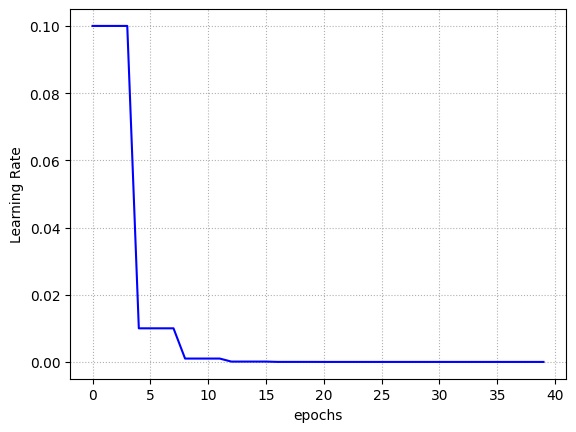

In [34]:
plt.plot(hist.history['lr'], color='b')
plt.xlabel("epochs")
plt.ylabel("Learning Rate")
plt.grid(linestyle='dotted')
plt.show()

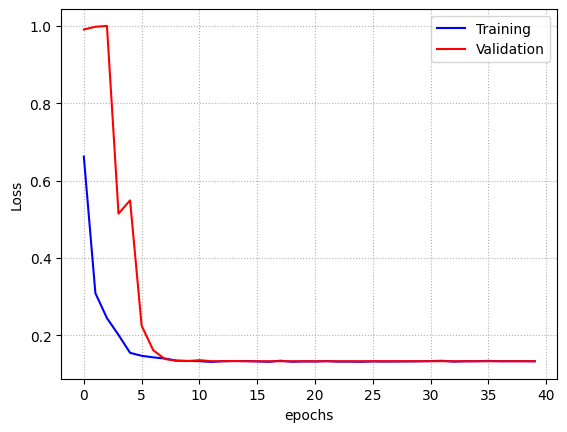

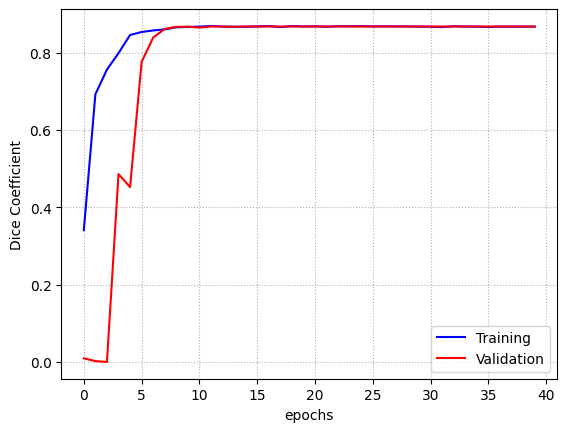

In [35]:
plt.plot(hist.history['loss'], color='b', label='Training')
plt.plot(hist.history['val_loss'], color='r', label='Validation')
plt.legend(loc='upper right')
plt.xlabel("epochs")
plt.ylabel("Loss")
plt.grid(linestyle='dotted')
plt.show()

plt.plot(hist.history['dice_coef'], color='b', label='Training')
plt.plot(hist.history['val_dice_coef'], color='r', label='Validation')
plt.xlabel("epochs")
plt.ylabel("Dice Coefficient")
plt.legend(loc='lower right')
plt.grid(linestyle='dotted')
plt.show()

In [36]:
model.save(dir_path+f"{loss}_{hist.history['val_dice_coef'][-1]:.4f}_b.keras")

In [37]:
eval_model = model.evaluate(imageLoader(val_df,32),steps=val_samples//32,return_dict=True)
eval_model

21/21 [==============================] - 2s 111ms/step - loss: 0.1346 - dice_coef: 0.8654 - jaccard_index: 0.7657 - hausdorff_distance: 0.4815 - precision: 0.9025 - dpce: 0.0142 - recall: 0.8342 - specificity: 0.9996 - f1_score: 0.8656 - accuracy: 0.9990


{'loss': 0.1345590353012085,
 'dice_coef': 0.8654410243034363,
 'jaccard_index': 0.7656728029251099,
 'hausdorff_distance': 0.48148614168167114,
 'precision': 0.9024653434753418,
 'dpce': 0.01424396876245737,
 'recall': 0.8341851234436035,
 'specificity': 0.9996318817138672,
 'f1_score': 0.8656381964683533,
 'accuracy': 0.9989796876907349}

In [38]:
from keras.models import load_model

l_model = load_model(best_model_path,custom_objects={'dice_loss': dice_loss,
                                                    'dice_coef': dice_coef,
                                                    'jaccard_index': jaccard_index,
                                                    'hausdorff_distance': hausdorff_distance,
                                                    'precision': precision,
                                                    'dpce': dpce,
                                                    'recall': recall,
                                                    'specificity': specificity,
                                                    'f1_score': f1_score,
                                                    'accuracy':accuracy})

l_eval = l_model.evaluate(imageLoader(val_df,64),steps=val_samples//64,return_dict=True)
l_eval

10/10 [==============================] - 19s 223ms/step - loss: 0.1302 - dice_coef: 0.8698 - jaccard_index: 0.7708 - hausdorff_distance: 0.4843 - precision: 0.9023 - dpce: 0.0144 - recall: 0.8414 - specificity: 0.9996 - f1_score: 0.8699 - accuracy: 0.9990


{'loss': 0.13022124767303467,
 'dice_coef': 0.8697787523269653,
 'jaccard_index': 0.7707654237747192,
 'hausdorff_distance': 0.48426470160484314,
 'precision': 0.9023004770278931,
 'dpce': 0.014378023333847523,
 'recall': 0.8414125442504883,
 'specificity': 0.9996170997619629,
 'f1_score': 0.8699297904968262,
 'accuracy': 0.9989689588546753}

In [39]:
final_dice = round(l_eval['dice_coef'],4)

In [40]:
l_model.save(best_model_path.split('.')[0]+f'_{final_dice}.keras')

In [41]:
print(final_dice)

0.8698


In [42]:
dir_path='/home/miglab/loss function project/spleen segmentation/'

In [43]:
hist_df.to_csv(dir_path+f"history/{loss}_{final_dice}.csv")

In [44]:
x_eval,y_eval = next(imageLoader(val_df,1024))

In [45]:
x_eval.shape

(695, 512, 512)

In [46]:
y_pred = model.predict(x_eval)

22/22 [==============================] - 2s 101ms/step


In [47]:
if y_pred.shape[-1] == 1:
    y_pred = np.squeeze(y_pred, axis=-1)
print(y_pred.shape)


(695, 512, 512)


In [48]:
import tensorflow as tf
import numpy as np
import tifffile
from tqdm import tqdm  # Import tqdm for progress monitoring

# Assuming the same data loading functions as you have provided.
def load(files, mask=False):
    images = []
    for file in files:
        if not mask:
            img = tifffile.imread('/home/miglab/loss function project/spleen segmentation/' + file) / 255
            images.append(img)
        else:
            img = tifffile.imread('/home/miglab/loss function project/spleen segmentation/' + file)
            images.append(img)
    return np.asarray(images)

def imageLoader(df, batch_size, noise=0):
    L = len(df)

    while True:
        batch_start = 0
        batch_end = batch_size

        while batch_start < L:
            limit = min(batch_end, L)
            
            X = load(df['image_path'][batch_start:limit])
            Y = load(df['label_path'][batch_start:limit], mask=True)
            Y = noise_add(Y, noise)
            
            yield (X, Y)

            batch_start += batch_size   
            batch_end += batch_size

# Define the MCDropoutModel class as before
class MCDropoutModel(tf.keras.Model):
    def __init__(self, model):
        super(MCDropoutModel, self).__init__()
        self.model = model

    def call(self, inputs, training=False):
        return self.model(inputs, training=training)

mc_model = MCDropoutModel(l_model)

# Modify this function to handle batched predictions with tqdm
def predict_with_dropout_batch(model, data_generator, steps, batch_size, num_samples):
    all_mean_predictions = []
    all_variance_predictions = []
    all_uncertainty_maps = []

    # Wrap the loop with tqdm for progress bar
    with tqdm(total=steps, desc="Processing Batches") as pbar:
        for step in range(steps):
            # Load the next batch of images
            x_batch, _ = next(data_generator)

            # Monte Carlo Dropout
            predictions = []
            for _ in range(num_samples):
                predictions.append(model(x_batch, training=True))

            predictions = tf.stack(predictions)

            # Calculate mean and variance across Monte Carlo samples
            mean_prediction = tf.reduce_mean(predictions, axis=0)
            variance_prediction = tf.math.reduce_variance(predictions, axis=0)

            # Uncertainty map (using entropy)
            uncertainty_map = -tf.reduce_sum(mean_prediction * tf.math.log(mean_prediction + 1e-8), axis=-1)

            # Collect results for this batch
            all_mean_predictions.append(mean_prediction.numpy())
            all_variance_predictions.append(variance_prediction.numpy())
            all_uncertainty_maps.append(uncertainty_map.numpy())

            # Update the progress bar
            pbar.update(1)

    # Concatenate all the batches back together
    all_mean_predictions = np.concatenate(all_mean_predictions, axis=0)
    all_variance_predictions = np.concatenate(all_variance_predictions, axis=0)
    all_uncertainty_maps = np.concatenate(all_uncertainty_maps, axis=0)

    return all_mean_predictions, all_variance_predictions, all_uncertainty_maps

# Now define how to run the entire process on the validation dataset

batch_size = 32  # Set this to a size that fits into your GPU memory
num_samples = 50  # Number of Monte Carlo dropout samples
steps = len(val_df) // batch_size + int(len(val_df) % batch_size != 0)  # Total number of steps

# Initialize the data generator
val_data_generator = imageLoader(val_df, batch_size)

# Run Monte Carlo Dropout prediction in batches
mean_predictions, variance_predictions, uncertainty_maps = predict_with_dropout_batch(
    mc_model, val_data_generator, steps, batch_size, num_samples
)

# Now you have the mean predictions, variance, and uncertainty maps for the entire dataset


Processing Batches: 100%|██████████| 22/22 [03:15<00:00,  8.87s/it]


In [49]:
# Inspect the shape of mean_predictions

# If the last dimension is 1, then squeeze. Otherwise, skip squeezing.
if mean_predictions.shape[-1] == 1:
    mean_predictions = np.squeeze(mean_predictions, axis=-1)

print(mean_predictions.shape)  # Verify the final shape


(695, 512, 512)


In [50]:
!nvidia-smi

Tue Sep 24 16:47:36 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.183.01             Driver Version: 535.183.01   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  NVIDIA RTX A5000               Off | 00000000:01:00.0  On |                  Off |
| 58%   78C    P2             174W / 230W |  19754MiB / 24564MiB |      6%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [51]:
uncertainty_maps.shape

(695, 512, 512)

In [52]:
import numpy as np
from tqdm import tqdm

# Define the Dice coefficient calculation function
def dice_coefficient(y_true, y_pred, smooth=1e-6):
    y_true_f = y_true.flatten()
    y_pred_f = y_pred.flatten()
    intersection = np.sum(y_true_f * y_pred_f)
    dice = (2. * intersection + smooth) / (np.sum(y_true_f) + np.sum(y_pred_f) + smooth)
    return dice

# Define the batch processing function with tqdm progress bar
def calculate_dice_in_batches(y_eval, mean_predictions, batch_size=16):
    dice_scores = []
    num_batches = int(np.ceil(len(y_eval) / batch_size))  # Calculate number of batches
    
    # Initialize tqdm progress bar
    with tqdm(total=num_batches, desc="Calculating Dice Coefficients", unit="batch") as pbar:
        for batch_idx in range(num_batches):
            start_idx = batch_idx * batch_size
            end_idx = min(start_idx + batch_size, len(y_eval))

            # Extract batch
            y_true_batch = y_eval[start_idx:end_idx]
            y_pred_batch = mean_predictions[start_idx:end_idx]

            # Calculate Dice coefficient for each image in the batch
            for y_true, y_pred in zip(y_true_batch, y_pred_batch):
                dice = dice_coefficient(y_true, y_pred)
                dice_scores.append(dice)
            
            pbar.update(1)  # Update tqdm progress bar
    
    return dice_scores

# Example of how to use this code (assuming y_eval and mean_predictions are defined)

# Binarize predictions using threshold
threshold = 0.5
mean_prediction_binary = (mean_predictions >= threshold).astype(bool)  # Fixed np.bool issue

# Adjust batch size
batch_size = 16

# Calculate Dice coefficients in batches
dice_scores = calculate_dice_in_batches(y_eval, mean_prediction_binary, batch_size=batch_size)

# Average Dice coefficient
average_dice = np.mean(dice_scores)

# Output results
print("Average Dice Coefficient:", average_dice)
print("Mean of predictions:", np.mean(mean_predictions))

# Check if uncertainty_maps is defined, if not, avoid printing
if 'uncertainty_maps' in globals():
    print("Mean of uncertainty:", np.mean(uncertainty_maps))
else:
    print("Uncertainty maps not defined.")


Calculating Dice Coefficients: 100%|██████████| 44/44 [00:00<00:00, 246.59batch/s]


Average Dice Coefficient: 0.8531896612692162
Mean of predictions: 0.0040355218
Mean of uncertainty: 0.00032696524


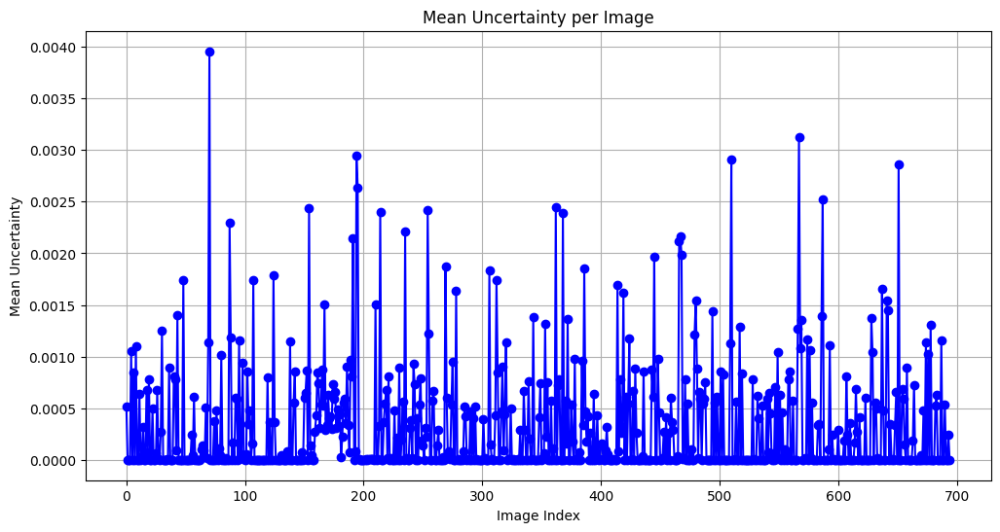

In [53]:
import numpy as np
import matplotlib.pyplot as plt

# Assuming `uncertainty_map` is your array of shape (5534, 512, 512)
# Step 1: Compute the mean uncertainty for each image
mean_uncertainty_per_image = np.mean(uncertainty_maps, axis=(1, 2)) 
mean_predictions_per_image = np.mean(mean_predictions, axis=(1, 2))  # Shape: (5534,)

# Step 2: Plot the uncertainty values against the image index
plt.figure(figsize=(12, 6))
plt.plot(range(len(mean_uncertainty_per_image)), mean_uncertainty_per_image, marker='o', linestyle='-', color='b')
plt.title("Mean Uncertainty per Image")
plt.xlabel("Image Index")
plt.ylabel("Mean Uncertainty")
plt.grid(True)
plt.show()


In [54]:
import numpy as np
  # Example array (replace with your own data)

# Save the array to a CSV file
np.savetxt(f"{loss}_uncertainty_spleen.csv", mean_uncertainty_per_image, delimiter=",")
# Save the array to a CSV file
np.savetxt(f"{loss}_mean_predictions_spleen.csv", mean_predictions_per_image, delimiter=",")


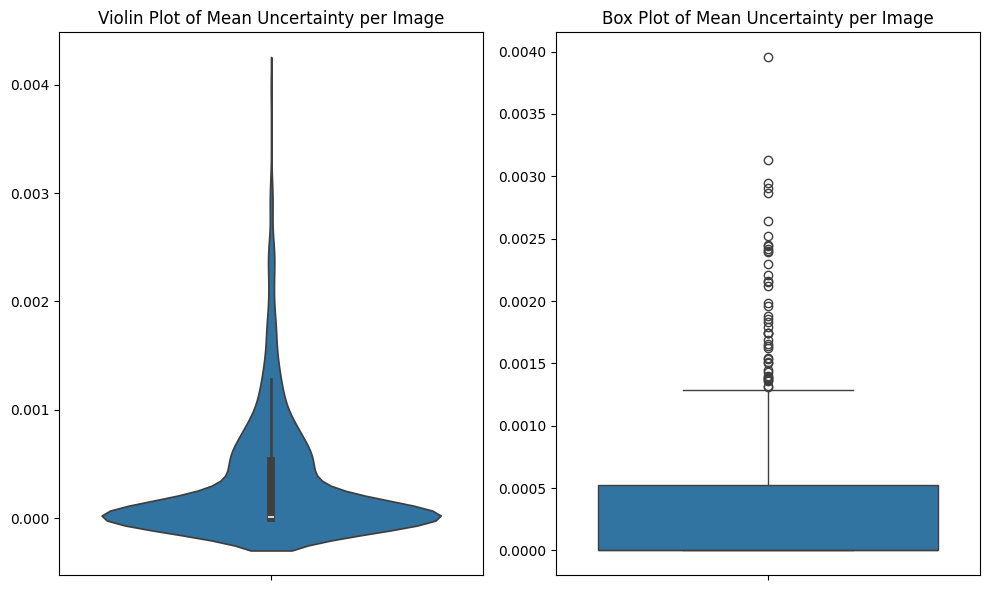

In [55]:
# Required libraries
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming your data is stored in mean_uncertainty_per_image
# mean_uncertainty_per_image = your_actual_array

# Initialize the figure
plt.figure(figsize=(10, 6))

# Create a subplot for both violin and box plots
plt.subplot(1, 2, 1)
sns.violinplot(y=mean_uncertainty_per_image)
plt.title("Violin Plot of Mean Uncertainty per Image")

plt.subplot(1, 2, 2)
sns.boxplot(y=mean_uncertainty_per_image)
plt.title("Box Plot of Mean Uncertainty per Image")

# Adjust layout for better spacing
plt.tight_layout()

# Show the plots
plt.show()


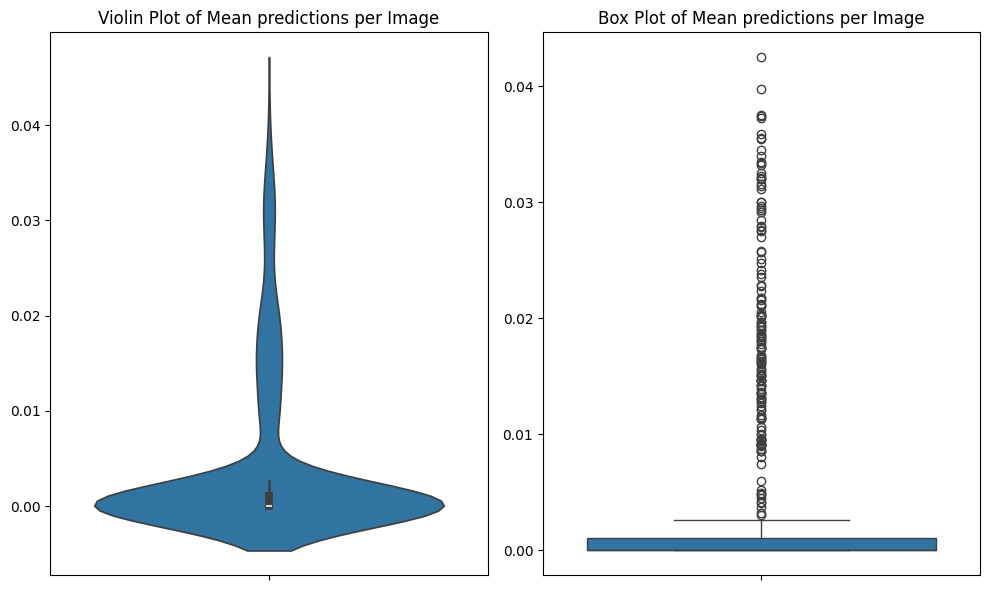

In [56]:
# Required libraries
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming your data is stored in mean_uncertainty_per_image
# mean_uncertainty_per_image = your_actual_array

# Initialize the figure
plt.figure(figsize=(10, 6))

# Create a subplot for both violin and box plots
plt.subplot(1, 2, 1)
sns.violinplot(y=mean_predictions_per_image)
plt.title("Violin Plot of Mean predictions per Image")

plt.subplot(1, 2, 2)
sns.boxplot(y=mean_predictions_per_image)
plt.title("Box Plot of Mean predictions per Image")

# Adjust layout for better spacing
plt.tight_layout()

# Show the plots
plt.show()


In [57]:
loss

'dice'

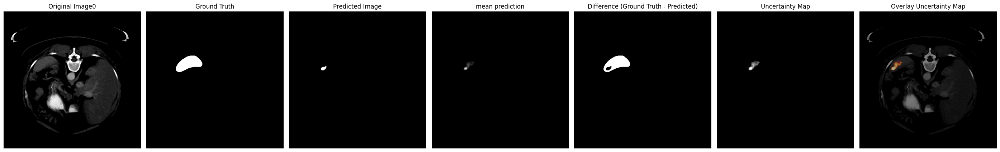

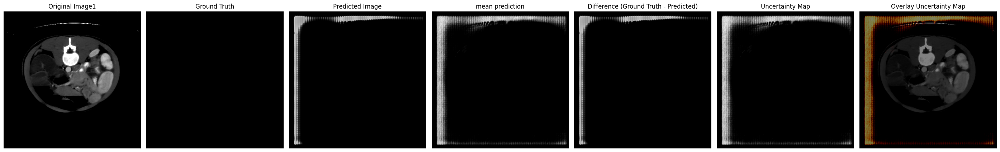

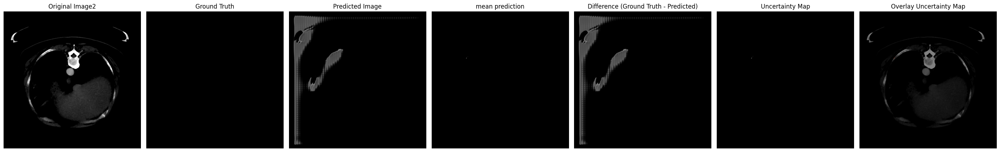

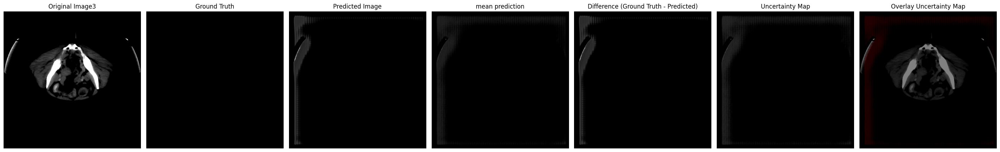

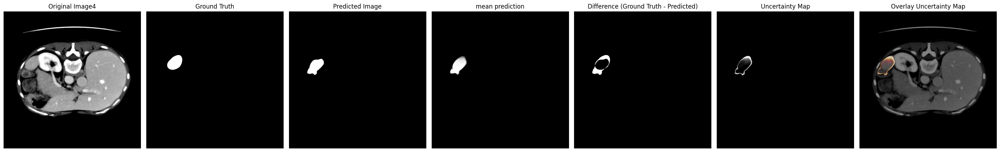

...

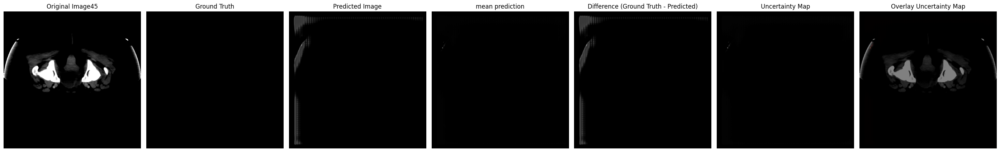

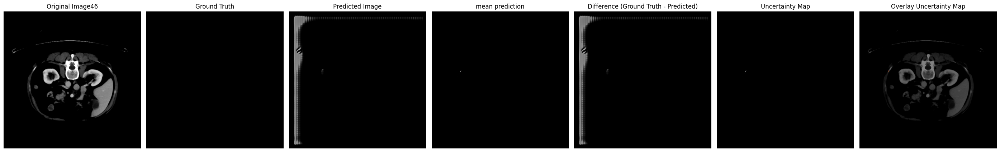

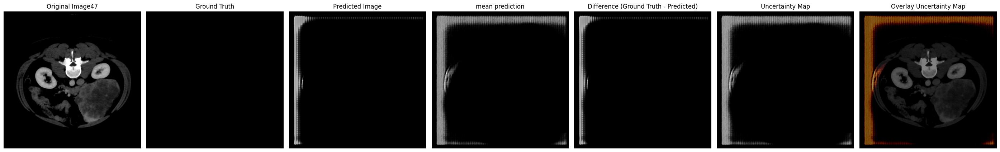

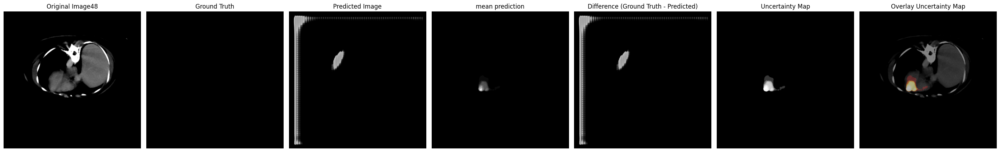

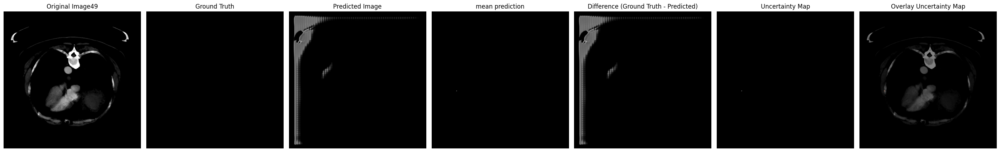

In [58]:
import numpy as np
import matplotlib.pyplot as plt

def plot_overlay_uncertainty(ax, image, uncertainty_map, title="Overlay Uncertainty Map"):
    ax.imshow(image, cmap='gray')  # Show the original image in grayscale
    ax.imshow(uncertainty_map, cmap='afmhot', alpha=0.5)  # Overlay uncertainty map
    ax.set_title(title)
    ax.axis('off')  # Turn off axis labels

# Assuming x_val, y_val, y_pred, and uncertainty_map_np are already defined

for i in range(0, 50, 1):
    fig, ax = plt.subplots(1, 7, figsize=(28, 7))  # Adjusted to 6 subplots in a 1x6 grid

    # Original image
    ax[0].imshow(x_eval[i, :, :], cmap='gray')
    ax[0].set_title(f'Original Image{i}')
    ax[0].axis('off')

    # Ground truth
    ax[1].imshow(y_eval[i, :, :], cmap='gray')
    ax[1].set_title('Ground Truth')
    ax[1].axis('off')

    # Predicted image
    ax[2].imshow(y_pred[i, :, :], cmap='gray')
    ax[2].set_title('Predicted Image')
    ax[2].axis('off')

    # Uncertainty map
    uncertainty_slice = uncertainty_maps[i]  # Access the corresponding uncertainty slice
    ax[5].imshow(uncertainty_slice, cmap='gray')
    ax[5].set_title('Uncertainty Map')
    ax[5].axis('off')

    # Difference between ground truth and predicted image
    difference = np.abs(np.squeeze(y_eval[i, :, :]) - np.squeeze(y_pred[i, :, :]))

    ax[4].imshow(difference, cmap='gray')
    ax[4].set_title('Difference (Ground Truth - Predicted)')
    ax[4].axis('off')

    ax[3].imshow(mean_predictions[i], cmap='gray')
    ax[3].set_title('mean prediction')
    ax[3].axis('off')


    # Overlay Uncertainty Map on Original Image
    plot_overlay_uncertainty(ax[6], x_eval[i, :, :], uncertainty_slice, "Overlay Uncertainty Map")

    plt.tight_layout()  # Adjust layout for better spacing
    plt.show()


In [59]:
import numpy as np

def compute_ece_mce(confidences, predictions, true_labels, n_bins=15):
    """
    Computes the Expected Calibration Error (ECE) and Maximum Calibration Error (MCE).

    Parameters:
    - confidences: Array of confidence scores (mean predictions from MC Dropout).
    - predictions: Array of model predictions (predicted class labels).
    - true_labels: Array of ground truth labels.
    - n_bins: Number of bins to divide the confidence scores into.

    Returns:
    - ece: Expected Calibration Error.
    - mce: Maximum Calibration Error.
    """
    # Define the bin boundaries
    bin_boundaries = np.linspace(0.0, 1.0, n_bins + 1)
    bin_lowers = bin_boundaries[:-1]
    bin_uppers = bin_boundaries[1:]

    ece = 0.0  # Expected Calibration Error
    mce = 0.0  # Maximum Calibration Error
    total_samples = len(confidences)

    # Loop over each bin
    for bin_lower, bin_upper in zip(bin_lowers, bin_uppers):
        # Get indices where confidence falls within the bin range
        in_bin = np.where((confidences > bin_lower) & (confidences <= bin_upper))[0]

        if len(in_bin) > 0:
            # Calculate accuracy and average confidence for the current bin
            accuracy_in_bin = np.mean(predictions[in_bin] == true_labels[in_bin])
            avg_confidence_in_bin = np.mean(confidences[in_bin])

            # ECE contribution for this bin (weighted by the number of samples in the bin)
            bin_error = np.abs(accuracy_in_bin - avg_confidence_in_bin)
            ece += len(in_bin) / total_samples * bin_error

            # Update MCE (maximum calibration error)
            mce = max(mce, bin_error)

    return ece, mce

# Example usage: Assuming you have the following arrays:
# confidences: mean predictions from MC Dropout (e.g., softmax scores or sigmoid outputs)
# y_pred: predicted class labels (from the mean predictions)
# y_true: ground truth labels

# # Example data (replace these with your actual data)
# confidences = np.array([0.9, 0.8, 0.7, 0.4, 0.2, 0.1])  # Confidence scores (mean predictions)
# y_pred = np.array([1, 1, 0, 0, 1, 0])  # Predicted labels
# y_true = np.array([1, 0, 0, 0, 1, 1])  # Ground truth labels

# Compute ECE and MCE
ece, mce = compute_ece_mce(mean_predictions,mean_prediction_binary, y_eval, n_bins=10)

print(f"Expected Calibration Error (ECE): {ece}")
print(f"Maximum Calibration Error (MCE): {mce}")


MemoryError: Unable to allocate 43.2 TiB for an array with shape (181376931, 512, 512) and data type bool

In [ ]:
from sklearn.calibration import calibration_curve

def plot_calibration(y_true, y_prob, model_name):
    prob_true, prob_pred = calibration_curve(y_true, y_prob, n_bins=10)
    plt.plot(prob_pred, prob_true, marker='o', label='model performance')
    plt.plot([0, 1], [0, 1], linestyle='--', label='Perfectly calibrated')
    plt.xlabel('Mean Predicted Probability')
    plt.ylabel('Fraction of Positives')
    plt.title('Calibration Curve')
    plt.legend()
    plt.show()

# For each model
y_true = y_eval.flatten()  # Flattened ground truth
y_prob = mean_predictions.flatten()     # Flattened predicted probabilities

plot_calibration(y_eval,mean_predictions,mc_model)
